## This repository contains the code and plots used for the mesoscale gravity wave diagnostics of the STORM-FEST case study submitted to the Quarterly Journal of the Royal Meteorological Society. These materials are provided for the reviewers to support reproducibility of the analysis.

## Model domains with stations

In [1]:
import os
import numpy as np
import xarray as xr
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.patheffects as pe
import matplotlib.ticker as mticker
from matplotlib.colors import ListedColormap, BoundaryNorm
from mpl_toolkits.mplot3d import Axes3D  # noqa: F401

import cartopy.crs as crs
import cartopy.feature as cfeature
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER
from netCDF4 import Dataset
from wrf import (
    getvar,
    to_np,
    latlon_coords,
    get_cartopy,
    cartopy_xlim,
    cartopy_ylim
)


DPI_UI = 600
mpl.rcParams.update({
    "figure.dpi": DPI_UI,
    "savefig.dpi": DPI_UI,
    "font.size": 9,
    "axes.labelsize": 9,
    "xtick.labelsize": 8,
    "ytick.labelsize": 8,
    "font.family": "DejaVu Sans",
})

data_dir = "/glade/work/rbhandari/data/SIM_Feb14_MP2"

wrf_files = {
    "d01": os.path.join(data_dir, "wrfout_d01_1992-02-14_15:00:00"),
    "d02": os.path.join(data_dir, "wrfout_d02_1992-02-14_15:00:00"),
    "d03": os.path.join(data_dir, "wrfout_d03_1992-02-14_15:00:00"),
}

met_em_file_1 = "/glade/derecho/scratch/rbhandari/SMOOTH-Terrain1/wpsv4.6.0/met_em.d01.1992-02-14_00:00:00.nc"
met_em_file_2 = "/glade/derecho/scratch/rbhandari/SMOOTH-Terrain1/wpsv4.6.0/met_em.d01.1992-02-14_00:00:00.nc_new"

ZMAX = 3000
LON_MIN = -115
LON_MAX = -80
middle_width_factor = 0.82

terrain_levels = np.arange(0, 3800 + 200, 200)

terrain_colors = [
    "#5D9232",  # 0-200
    "#94CC31",  # 200-400
    "#ADE64E",  # 400-600
    "#C8F26F",  # 600-800
    "#E8F5A6",  # 800-1000
    "#F7F0BA",  # 1000-1200
    "#EFE5A3",  # 1200-1400
    "#E2D67D",  # 1400-1600
    "#D5C254",  # 1600-1800
    "#CBA72E",  # 1800-2000
    "#A87925",  # 2000-2200
    "#7E5728",  # 2200-2400
    "#68451F",  # 2400-2600
    "#563817",  # 2600-2800
    "#9B8D86",  # 2800-3000
    "#B1A7A0",  # 3000-3200
    "#C7BFB8",  # 3200-3400
    "#DCD6D0",  # 3400-3600
    "#EEEAE5",  # 3600-3800
     
     
]

terrain_cmap = ListedColormap(terrain_colors, name="manual_terrain")
terrain_cmap.set_under("#2D78D4")
terrain_cmap.set_over("#FFFFFF")
terrain_cmap.set_bad((1, 1, 1, 0))

terrain_norm = BoundaryNorm(
    terrain_levels,
    ncolors=terrain_cmap.N,
    clip=False
)


def load_and_mask_terrain(ncfile, lon_min, lon_max):

    ds = xr.open_dataset(ncfile)

    HGT = ds["HGT_M"].isel(Time=0).values
    lat = ds["XLAT_M"].isel(Time=0).values
    lon = ds["XLONG_M"].isel(Time=0).values

    mask = (lon >= lon_min) & (lon <= lon_max)

    HGT_m = np.where(mask, HGT, np.nan)
    lat_m = np.where(mask, lat, np.nan)
    lon_m = np.where(mask, lon, np.nan)

    ds.close()

    return HGT, HGT_m, lat_m, lon_m


def plot_domain_boundary(ax, lons, lats, color, linewidth):

    ax.plot(
        to_np(lons[0, :]),
        to_np(lats[0, :]),
        color=color,
        lw=linewidth,
        transform=crs.PlateCarree()
    )

    ax.plot(
        to_np(lons[-1, :]),
        to_np(lats[-1, :]),
        color=color,
        lw=linewidth,
        transform=crs.PlateCarree()
    )

    ax.plot(
        to_np(lons[:, 0]),
        to_np(lats[:, 0]),
        color=color,
        lw=linewidth,
        transform=crs.PlateCarree()
    )

    ax.plot(
        to_np(lons[:, -1]),
        to_np(lats[:, -1]),
        color=color,
        lw=linewidth,
        transform=crs.PlateCarree()
    )


def add_panel_label(ax, panel_label, title):

    text = f"{panel_label} {title}"

    bbox_style = dict(
        facecolor="white",
        edgecolor="none",
        alpha=0.75,
        pad=2.0
    )

    if hasattr(ax, "text2D"):
        ax.text2D(
            0.02,
            0.96,
            text,
            transform=ax.transAxes,
            fontsize=10,
            fontweight="bold",
            ha="left",
            va="top",
            bbox=bbox_style
        )
    else:
        ax.text(
            0.02,
            0.96,
            text,
            transform=ax.transAxes,
            fontsize=10,
            fontweight="bold",
            ha="left",
            va="top",
            bbox=bbox_style,
            zorder=50
        )


with Dataset(wrf_files["d01"]) as nc:

    ter_d01 = getvar(nc, "ter", timeidx=0)
    lat_d01, lon_d01 = latlon_coords(ter_d01)

ter_d01_np = to_np(ter_d01)


with Dataset(wrf_files["d03"]) as nc:

    ter_d03 = getvar(nc, "ter", timeidx=0)
    lat_d03, lon_d03 = latlon_coords(ter_d03)

ter_d03_np = to_np(ter_d03)
cart_proj_d03 = get_cartopy(ter_d03)

levels = terrain_levels

HGT1, HGT1_m, lat1_m, lon1_m = load_and_mask_terrain(
    met_em_file_1,
    LON_MIN,
    LON_MAX
)

HGT2, HGT2_m, lat2_m, lon2_m = load_and_mask_terrain(
    met_em_file_2,
    LON_MIN,
    LON_MAX
)

HGT1_color = np.ma.masked_invalid(HGT1_m)
HGT2_color = np.ma.masked_invalid(HGT2_m)

fc1 = terrain_cmap(terrain_norm(HGT1_color))
fc2 = terrain_cmap(terrain_norm(HGT2_color))

stations = {
    "DDC": {
        "lat": 37.7634,
        "lon": -99.9656,
        "label": "DDC",
    },
    "ARK": {
        "lat": 37.05133,
        "lon": -97.15,
        "label": "ARK",
    },
    "LRN": {
        "lat": 38.18,
        "lon": -99.10,
        "label": "LRN",
    },
    "EMP": {
        "lat": 38.33,
        "lon": -96.19,
        "label": "EMP",
    },
    "PAM16": {
        "lat": 38.37,
        "lon": -93.68,
        "label": "PAM16",
    },
    "SLN": {
        "lat": 38.7910,
        "lon": -97.6522,
        "label": "SLN",
    },
    "FRY": {
        "lat": 39.0553,
        "lon": -96.7645,
        "label": "FRY",
    },
    "MHK": {
        "lat": 39.20,
        "lon": -96.60,
        "label": "MHK",
    },
    "TOP": {
        "lat": 39.0687,
        "lon": -95.6225,
        "label": "TOP",
    },
    "FLV": {
        "lat": 39.3683,
        "lon": -94.9147,
        "label": "FLV",
    },
    "MCI": {
        "lat": 39.2976,
        "lon": -94.7139,
        "label": "MCI",
    },
    "SEN": {
        "lat": 39.8235,
        "lon": -96.08633,
        "label": "SEN",
    },
    "STL": {
        "lat": 38.7487,
        "lon": -90.3700,
        "label": "STL",
    },
    "IOW": {
        "lat": 41.71,
        "lon": -91.61,
        "label": "IOW",
    },
}

d03_station_offsets = {
    "DDC": {"dx": -0.18, "dy": -0.16, "ha": "right"},
    "ARK": {"dx": -0.16, "dy": -0.16, "ha": "right"},
    "LRN": {"dx": -0.18, "dy": -0.16, "ha": "right"},
    "EMP": {"dx": 0.12, "dy": -0.16, "ha": "left"},
    "PAM16": {"dx": 0.12, "dy": 0.16, "ha": "left"},
    "SLN": {"dx": -0.18, "dy": -0.16, "ha": "right"},
    "FRY": {"dx": -0.26, "dy": -0.10, "ha": "right"},
    "MHK": {"dx": 0.18, "dy": 0.18, "ha": "left"},
    "TOP": {"dx": 0.12, "dy": -0.16, "ha": "left"},
    "FLV": {"dx": 0.12, "dy": 0.16, "ha": "left"},
    "MCI": {"dx": 0.12, "dy": -0.16, "ha": "left"},
    "SEN": {"dx": 0.12, "dy": 0.16, "ha": "left"},
    "STL": {"dx": 0.12, "dy": -0.16, "ha": "left"},
    "IOW": {"dx": 0.12, "dy": 0.16, "ha": "left"},
}

fig = plt.figure(figsize=(12, 17))

gs = fig.add_gridspec(
    3,
    2,
    height_ratios=[1.25, 0.78, 1.05],
    hspace=0.18,
    wspace=0.16
)

ax_top = fig.add_subplot(gs[0, :], projection=crs.PlateCarree())
ax_d03 = fig.add_subplot(gs[1, :], projection=cart_proj_d03)
ax1 = fig.add_subplot(gs[2, 0], projection="3d")
ax2 = fig.add_subplot(gs[2, 1], projection="3d")

ax_top.add_feature(cfeature.COASTLINE, linewidth=0.5)
ax_top.add_feature(cfeature.BORDERS, linewidth=0.5)
ax_top.add_feature(cfeature.STATES, linewidth=0.4)

cf = ax_top.contourf(
    to_np(lon_d01),
    to_np(lat_d01),
    ter_d01_np,
    levels=levels,
    cmap=terrain_cmap,
    norm=terrain_norm,
    extend="both",
    transform=crs.PlateCarree()
)

colors = {"d01": "black", "d02": "red", "d03": "#FFDB58"}
lw = {"d01": 1.2, "d02": 1.2, "d03": 1.5}

domain_lats_lons = {}

for dom, file in wrf_files.items():

    with Dataset(file) as nc:
        lats, lons = latlon_coords(getvar(nc, "T2", timeidx=0))

    domain_lats_lons[dom] = (lats, lons)

    plot_domain_boundary(
        ax_top,
        lons,
        lats,
        colors[dom],
        lw[dom]
    )

gl = ax_top.gridlines(
    draw_labels=True,
    linestyle="--",
    linewidth=0.4
)

gl.top_labels = False
gl.right_labels = False
gl.xformatter = LONGITUDE_FORMATTER
gl.yformatter = LATITUDE_FORMATTER
gl.xlabel_style = {"size": 8}
gl.ylabel_style = {"size": 8}

add_panel_label(ax_top, "(a)", "WRF model domains")

ax_d03.add_feature(cfeature.COASTLINE, linewidth=0.4)
ax_d03.add_feature(cfeature.BORDERS, linewidth=0.4)
ax_d03.add_feature(cfeature.STATES, linewidth=0.6)

cf_d03 = ax_d03.contourf(
    to_np(lon_d03),
    to_np(lat_d03),
    ter_d03_np,
    levels=levels,
    cmap=terrain_cmap,
    norm=terrain_norm,
    extend="both",
    transform=crs.PlateCarree()
)

d03_lats, d03_lons = domain_lats_lons["d03"]

plot_domain_boundary(
    ax_d03,
    d03_lons,
    d03_lats,
    "#FFDB58",
    1.6
)

xlim_d03 = cartopy_xlim(ter_d03)
ylim_d03 = cartopy_ylim(ter_d03)

ax_d03.set_xlim(*xlim_d03)
ax_d03.set_ylim(*ylim_d03)
ax_d03.set_aspect("auto", adjustable="box")

d03_lon_min = float(np.nanmin(to_np(lon_d03)))
d03_lon_max = float(np.nanmax(to_np(lon_d03)))
d03_lat_min = float(np.nanmin(to_np(lat_d03)))
d03_lat_max = float(np.nanmax(to_np(lat_d03)))

lon_ticks = np.arange(
    np.floor(d03_lon_min),
    np.ceil(d03_lon_max) + 1,
    3
)

lat_ticks = np.arange(
    np.floor(d03_lat_min),
    np.ceil(d03_lat_max) + 1,
    2
)

gl_d03 = ax_d03.gridlines(
    crs=crs.PlateCarree(),
    draw_labels=True,
    linestyle="--",
    linewidth=0.4,
    x_inline=False,
    y_inline=False
)

gl_d03.top_labels = False
gl_d03.bottom_labels = True
gl_d03.left_labels = True
gl_d03.right_labels = False
gl_d03.xlocator = mticker.FixedLocator(lon_ticks)
gl_d03.ylocator = mticker.FixedLocator(lat_ticks)
gl_d03.xformatter = LONGITUDE_FORMATTER
gl_d03.yformatter = LATITUDE_FORMATTER
gl_d03.xlabel_style = {"size": 8}
gl_d03.ylabel_style = {"size": 8}

for sid, st in stations.items():

    ax_d03.scatter(
        st["lon"],
        st["lat"],
        s=17,
        color="black",
        edgecolor="black",
        linewidth=0.35,
        zorder=12,
        transform=crs.PlateCarree()
    )

    ax_d03.text(
        st["lon"] + d03_station_offsets[sid]["dx"],
        st["lat"] + d03_station_offsets[sid]["dy"],
        st["label"],
        fontsize=6.8,
        fontweight="medium",
        color="black",
        ha=d03_station_offsets[sid]["ha"],
        va="center",
        zorder=13,
        transform=crs.PlateCarree(),
        path_effects=[
            pe.withStroke(linewidth=1.5, foreground="white")
        ]
    )

add_panel_label(ax_d03, "(b)", "D3")

ax1.plot_surface(
    lon1_m,
    lat1_m,
    HGT1_m,
    facecolors=fc1,
    rstride=1,
    cstride=1,
    edgecolor="none",
    shade=False
)

ax1.set_xlabel("Longitude")
ax1.set_ylabel("Latitude")
ax1.set_zlabel("Terrain height (m)", labelpad=8)
ax1.set_xlim(LON_MIN, LON_MAX)
ax1.set_zlim(0, ZMAX)
add_panel_label(ax1, "(c)", "CNTRL terrain")

ax2.plot_surface(
    lon2_m,
    lat2_m,
    HGT2_m,
    facecolors=fc2,
    rstride=1,
    cstride=1,
    edgecolor="none",
    shade=False
)

ax2.set_xlabel("Longitude")
ax2.set_ylabel("Latitude")
ax2.set_zlabel("Terrain height (m)", labelpad=8)
ax2.set_xlim(LON_MIN, LON_MAX)
ax2.set_zlim(0, ZMAX)
add_panel_label(ax2, "(d)", "SMT terrain")

fig.subplots_adjust(
    left=0.06,
    right=0.93,
    top=0.965,
    bottom=0.08
)

pos = ax_d03.get_position()
new_width = pos.width * middle_width_factor
new_x0 = pos.x0 + 0.5 * (pos.width - new_width)

ax_d03.set_position([
    new_x0,
    pos.y0,
    new_width,
    pos.height
])

cax = fig.add_axes([0.18, 0.035, 0.64, 0.020])

cbar = fig.colorbar(
    cf,
    cax=cax,
    orientation="horizontal",
    ticks=terrain_levels,
    extend="both"
)

cbar.set_label("Elevation (m)")
cbar.ax.tick_params(labelsize=7, length=0)
cbar.outline.set_visible(False)

out_base = "QJRMS-TH"

plt.savefig(
    f"{out_base}.png",
    dpi=600,
    bbox_inches="tight"
)

plt.savefig(
    f"{out_base}.pdf",
    bbox_inches="tight"
)

plt.show()

## Synoptic Analysis

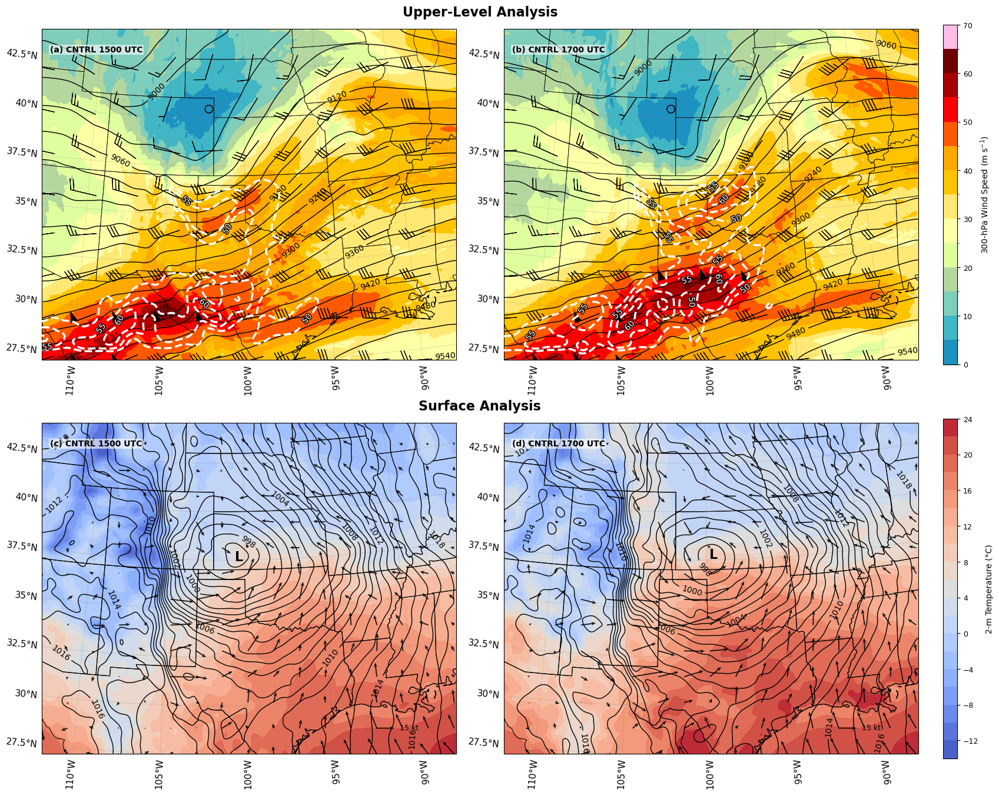

In [33]:
from netCDF4 import Dataset
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.patheffects as pe
import cartopy.crs as crs
from cartopy.feature import STATES, BORDERS
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER
from wrf import getvar, interplevel, to_np, latlon_coords, get_cartopy
from scipy.ndimage import gaussian_filter, minimum_position

import metpy.calc as mpcalc
from metpy.units import units

dataDir = "/glade/work/rbhandari/data/SIM_Feb14_MP2"

times = ["15:00:00", "17:00:00"]
file_paths = [f"{dataDir}/wrfout_d02_1992-02-14_{t}" for t in times]

panel_titles_300 = [
    "(a) CNTRL 1500 UTC",
    "(b) CNTRL 1700 UTC",
]

panel_titles_sfc = [
    "(c) CNTRL 1500 UTC",
    "(d) CNTRL 1700 UTC",
]

level = 300

bounds = np.arange(0, 75, 5)

colors = [
    "#1D91C0",
    "#41B6C4",
    "#7FCDBB",
    "#B4D79E",
    "#DFFF9E",
    "#FFFFA6",
    "#FFE873",
    "#FFC400",
    "#FFAA00",
    "#FF5900",
    "#FF0000",
    "#A80000",
    "#6E0000",
    "#FFBEE8",
]

jet_cmap = mcolors.ListedColormap(colors)
jet_norm = mcolors.BoundaryNorm(bounds, jet_cmap.N)

geo_levels = np.arange(50, 95, 5)

sigma_z_for_geo = 9
sigma_vg_contour = 5
sigma_ht_contour = 7

barb_step = 60

SLP_SIGMA = 6
T2_SIGMA = 4

SLP_CONTOUR_INT = 1
SLP_LW = 1
SLP_CLABEL_SIZE = 10
SLP_LABEL_EVERY = 2

T2_CMAP = "coolwarm"
T2_ALPHA = 0.95

QUIVER_SKIP = 37
QUIVER_SCALE = 350
QUIVER_WIDTH = 0.0025
QUIVER_HEADWIDTH = 3.5
QUIVER_HEADLENGTH = 4.2
QUIVER_HEADA = 3.2
QUIVER_ALPHA = 0.9

QUIVERKEY_U = 15
QUIVERKEY_LABEL = "15 kt"
QUIVERKEY_X, QUIVERKEY_Y = 0.85, 0.08


def apply_gridlines(ax):
    gl = ax.gridlines(
        draw_labels=True,
        dms=True,
        x_inline=False,
        y_inline=False,
        linewidth=0.5,
        color="gray",
        alpha=0.5,
        linestyle="--"
    )

    gl.top_labels = False
    gl.right_labels = False
    gl.xlabel_style = {"size": 11}
    gl.ylabel_style = {"size": 11}
    gl.xformatter = LONGITUDE_FORMATTER
    gl.yformatter = LATITUDE_FORMATTER

    return gl


def add_panel_tag(ax, text):
    ax.text(
        0.02, 0.95, text,
        transform=ax.transAxes,
        fontsize=10,
        fontweight="bold",
        ha="left",
        va="top",
        bbox=dict(facecolor="white", alpha=0.6, edgecolor="none", pad=1),
        zorder=20
    )


def add_low_marker(ax, slp_field, lats, lons):
    try:
        ii, jj = minimum_position(slp_field)

        ax.text(
            float(lons[ii, jj]),
            float(lats[ii, jj]),
            "L",
            transform=crs.PlateCarree(),
            ha="center",
            va="center",
            fontsize=16,
            fontweight="bold",
            color="black",
            zorder=20
        )
    except Exception:
        pass


def clabel_levels_from_contours(cs):
    levs = [l for l in cs.levels if (l % SLP_LABEL_EVERY) == 0]
    return levs if len(levs) > 0 else cs.levels[::2]


def get_common_t2_levels(file_paths):
    t2_min_all = []
    t2_max_all = []

    for path in file_paths:
        ncfile = Dataset(path)

        t2_C = to_np(getvar(ncfile, "T2")) - 273.15
        t2_np = gaussian_filter(t2_C, sigma=T2_SIGMA)

        t2_min_all.append(float(np.nanmin(t2_np)))
        t2_max_all.append(float(np.nanmax(t2_np)))

        ncfile.close()

    t2_min = min(t2_min_all)
    t2_max = max(t2_max_all)

    t2_levels = np.arange(
        2 * np.floor(t2_min / 2.0),
        2 * np.ceil(t2_max / 2.0) + 2,
        2
    )

    return t2_levels


def plot_300hpa_panel(ncfile, ax, title):
    p = getvar(ncfile, "pressure")
    z = getvar(ncfile, "z", units="m")
    uvmet = getvar(ncfile, "uvmet", units="m/s")
    wspd = getvar(ncfile, "wspd_wdir", units="m/s")[0, :]

    z_lev = interplevel(z, p, level)
    u_lev = interplevel(uvmet[0], p, level)
    v_lev = interplevel(uvmet[1], p, level)
    wspd_lev = interplevel(wspd, p, level)

    lats, lons = latlon_coords(z_lev)
    lat = to_np(lats)
    lon = to_np(lons)

    Z_raw_np = np.ma.filled(to_np(z_lev), np.nan)
    Z_geo = gaussian_filter(Z_raw_np, sigma=sigma_z_for_geo) * units.m

    dx, dy = mpcalc.lat_lon_grid_deltas(lon, lat)

    geo_u, geo_v = mpcalc.geostrophic_wind(
        Z_geo,
        dx=dx,
        dy=dy,
        latitude=lat * units.deg
    )

    Vg = mpcalc.wind_speed(geo_u, geo_v).to("m/s").magnitude
    Vg_smooth = gaussian_filter(Vg, sigma=sigma_vg_contour)

    ax.coastlines("50m", linewidth=0.8)
    ax.add_feature(STATES, linewidth=0.5)
    ax.add_feature(BORDERS, linewidth=0.5)

    ht_m = gaussian_filter(Z_raw_np, sigma=sigma_ht_contour)

    levels_ht = np.arange(
        30 * np.floor(np.nanmin(ht_m) / 30),
        30 * np.ceil(np.nanmax(ht_m) / 30) + 30,
        30
    )

    cs1 = ax.contour(
        lon, lat, ht_m,
        levels=levels_ht,
        colors="black",
        linewidths=1,
        transform=crs.PlateCarree()
    )

    ax.clabel(cs1, levels=cs1.levels[::2], fontsize=10, fmt="%d")

    wspd_np = np.ma.filled(to_np(wspd_lev), np.nan)
    wspd_mask = np.ma.masked_less(wspd_np, bounds[0])

    cf1 = ax.contourf(
        lon, lat, wspd_mask,
        levels=bounds,
        cmap=jet_cmap,
        norm=jet_norm,
        transform=crs.PlateCarree()
    )

    cg = ax.contour(
        lon, lat, Vg_smooth,
        levels=geo_levels,
        colors="white",
        linewidths=2.5,
        linestyles="--",
        transform=crs.PlateCarree(),
        zorder=8
    )

    labels = ax.clabel(
        cg,
        fontsize=10,
        fmt="%.0f",
        colors="white",
        inline=True
    )

    for txt in labels:
        txt.set_fontweight("normal")
        txt.set_alpha(1.0)
        txt.set_zorder(20)
        txt.set_path_effects([
            pe.withStroke(linewidth=2, foreground="black")
        ])

    slc = (slice(None, None, barb_step), slice(None, None, barb_step))

    u_true = np.ma.filled(to_np(u_lev), np.nan)
    v_true = np.ma.filled(to_np(v_lev), np.nan)

    ax.barbs(
        lon[slc], lat[slc],
        u_true[slc], v_true[slc],
        transform=crs.PlateCarree(),
        color="black",
        length=8.0,
        linewidth=0.8,
        pivot="middle",
        barb_increments=dict(half=5, full=10, flag=50),
        zorder=7
    )

    apply_gridlines(ax)
    add_panel_tag(ax, title)

    return cf1


def plot_surface_panel(ncfile, ax, title, t2_levels):
    slp_obj = getvar(ncfile, "slp")
    lats2, lons2 = latlon_coords(slp_obj)

    lat2 = to_np(lats2)
    lon2 = to_np(lons2)

    slp_np = gaussian_filter(to_np(slp_obj), sigma=SLP_SIGMA)

    t2_C = to_np(getvar(ncfile, "T2")) - 273.15
    t2_np = gaussian_filter(t2_C, sigma=T2_SIGMA)

    uv10 = getvar(ncfile, "uvmet10", units="kt")
    u10 = to_np(uv10[0])
    v10 = to_np(uv10[1])

    slp_min = SLP_CONTOUR_INT * np.floor(np.nanmin(slp_np) / SLP_CONTOUR_INT)
    slp_max = SLP_CONTOUR_INT * np.ceil(np.nanmax(slp_np) / SLP_CONTOUR_INT)

    slp_levels = np.arange(
        slp_min,
        slp_max + SLP_CONTOUR_INT,
        SLP_CONTOUR_INT
    )

    ax.coastlines("50m", linewidth=0.8)
    ax.add_feature(STATES, linewidth=0.8)
    ax.add_feature(BORDERS, linewidth=0.8)

    cf2 = ax.contourf(
        lon2, lat2, t2_np,
        levels=t2_levels,
        cmap=T2_CMAP,
        transform=crs.PlateCarree(),
        alpha=T2_ALPHA,
        zorder=1
    )

    cs2 = ax.contour(
        lon2, lat2, slp_np,
        levels=slp_levels,
        colors="black",
        linewidths=SLP_LW,
        transform=crs.PlateCarree(),
        zorder=3
    )

    ax.clabel(
        cs2,
        levels=clabel_levels_from_contours(cs2),
        fontsize=SLP_CLABEL_SIZE,
        fmt="%.0f"
    )

    qv = ax.quiver(
        lon2[::QUIVER_SKIP, ::QUIVER_SKIP],
        lat2[::QUIVER_SKIP, ::QUIVER_SKIP],
        u10[::QUIVER_SKIP, ::QUIVER_SKIP],
        v10[::QUIVER_SKIP, ::QUIVER_SKIP],
        transform=crs.PlateCarree(),
        scale=QUIVER_SCALE,
        width=QUIVER_WIDTH,
        headwidth=QUIVER_HEADWIDTH,
        headlength=QUIVER_HEADLENGTH,
        headaxislength=QUIVER_HEADA,
        alpha=QUIVER_ALPHA,
        zorder=4
    )

    ax.quiverkey(
        qv,
        X=QUIVERKEY_X,
        Y=QUIVERKEY_Y,
        U=QUIVERKEY_U,
        label=QUIVERKEY_LABEL,
        labelpos="E",
        coordinates="axes",
        color="black",
        labelcolor="black",
        fontproperties={"size": 9},
        zorder=10
    )

    add_low_marker(ax, slp_np, lat2, lon2)

    apply_gridlines(ax)
    add_panel_tag(ax, title)

    return cf2


t2_levels_common = get_common_t2_levels(file_paths)

nc0 = Dataset(file_paths[0])
proj = get_cartopy(getvar(nc0, "z", units="dm"))
nc0.close()

fig = plt.figure(figsize=(17, 14))

gs = fig.add_gridspec(
    nrows=2,
    ncols=5,
    width_ratios=[1.0, 0.08, 1.0, 0.025, 0.035],
    height_ratios=[1, 1],
    left=0.05,
    right=0.965,
    bottom=0.05,
    top=0.94,
    wspace=0.04,
    hspace=0.16
)

ax300_1500 = fig.add_subplot(gs[0, 0], projection=proj)
ax300_1700 = fig.add_subplot(gs[0, 2], projection=proj)

axsfc_1500 = fig.add_subplot(gs[1, 0], projection=proj)
axsfc_1700 = fig.add_subplot(gs[1, 2], projection=proj)

cax_300 = fig.add_subplot(gs[0, 4])
cax_sfc = fig.add_subplot(gs[1, 4])

cf1_for_cbar = None
cf2_for_cbar = None

for i, ncfile_path in enumerate(file_paths):
    ncfile = Dataset(ncfile_path)

    if i == 0:
        cf1_for_cbar = plot_300hpa_panel(ncfile, ax300_1500, panel_titles_300[i])
        cf2_for_cbar = plot_surface_panel(ncfile, axsfc_1500, panel_titles_sfc[i], t2_levels_common)

    if i == 1:
        cf1_for_cbar = plot_300hpa_panel(ncfile, ax300_1700, panel_titles_300[i])
        cf2_for_cbar = plot_surface_panel(ncfile, axsfc_1700, panel_titles_sfc[i], t2_levels_common)

    ncfile.close()

cbar1 = fig.colorbar(cf1_for_cbar, cax=cax_300, orientation="vertical")
cbar1.set_label("300-hPa Wind Speed (m s$^{-1}$)", fontsize=10, labelpad=8)
cbar1.ax.tick_params(labelsize=9)
cbar1.ax.yaxis.set_label_position("right")
cbar1.ax.yaxis.set_ticks_position("right")

cbar2 = fig.colorbar(cf2_for_cbar, cax=cax_sfc, orientation="vertical")
cbar2.set_label("2-m Temperature (°C)", fontsize=10, labelpad=8)
cbar2.ax.tick_params(labelsize=9)

plot_left = min(
    ax300_1500.get_position().x0,
    axsfc_1500.get_position().x0
)

plot_right = max(
    ax300_1700.get_position().x1,
    axsfc_1700.get_position().x1
)

plot_center = 0.5 * (plot_left + plot_right)

upper_title_y = ax300_1500.get_position().y1 + 0.012
surface_title_y = axsfc_1500.get_position().y1 + 0.012

fig.text(
    plot_center,
    upper_title_y,
    "Upper-Level Analysis",
    ha="center",
    va="bottom",
    fontsize=16,
    fontweight="bold"
)

fig.text(
    plot_center,
    surface_title_y,
    "Surface Analysis",
    ha="center",
    va="bottom",
    fontsize=16,
    fontweight="bold"
)

plt.savefig(
    "CNTRL-Synoptic-Analysis-QJRMS-Revision.png",
    dpi=600,
    bbox_inches="tight"
)

plt.show()

## Synoptic Analysis for SMT

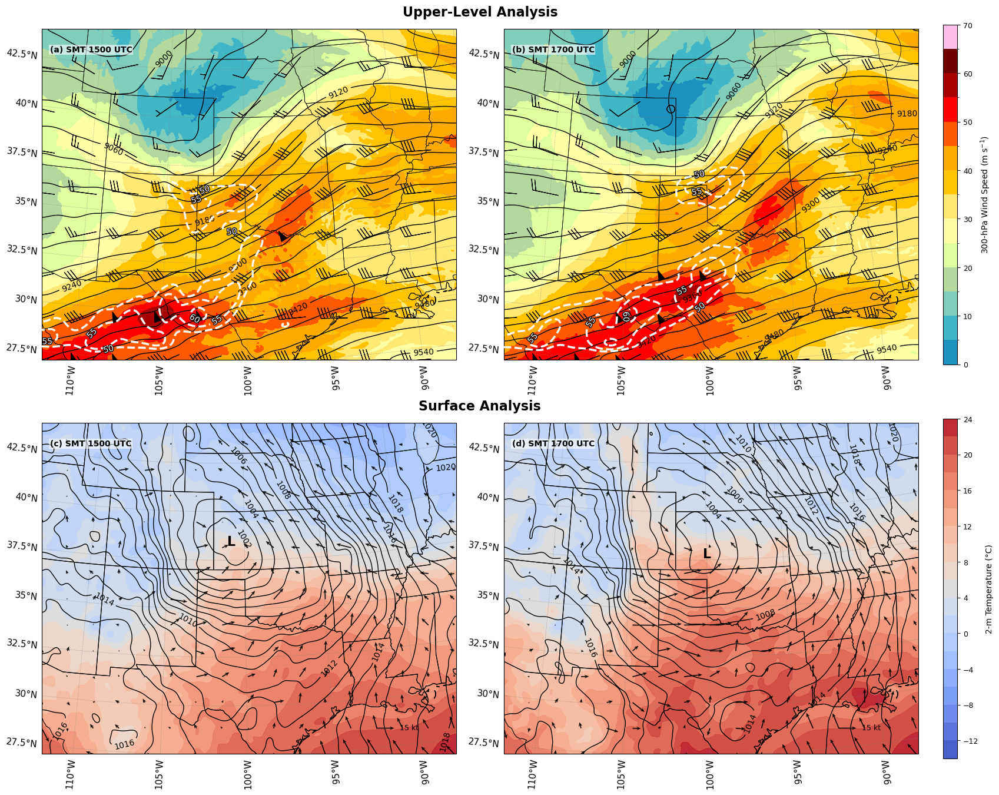

In [1]:
from netCDF4 import Dataset
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.patheffects as pe
import cartopy.crs as crs
from cartopy.feature import STATES, BORDERS
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER
from wrf import getvar, interplevel, to_np, latlon_coords, get_cartopy
from scipy.ndimage import gaussian_filter, minimum_position

import metpy.calc as mpcalc
from metpy.units import units

dataDir = "/glade/work/rbhandari/data/SIM_FEB14_MP2_SMT"

times = ["15:00:00", "17:00:00"]
file_paths = [f"{dataDir}/wrfout_d02_1992-02-14_{t}" for t in times]

panel_titles_300 = [
    "(a) SMT 1500 UTC",
    "(b) SMT 1700 UTC",
]

panel_titles_sfc = [
    "(c) SMT 1500 UTC",
    "(d) SMT 1700 UTC",
]

level = 300

bounds = np.arange(0, 75, 5)

colors = [
    "#1D91C0",
    "#41B6C4",
    "#7FCDBB",
    "#B4D79E",
    "#DFFF9E",
    "#FFFFA6",
    "#FFE873",
    "#FFC400",
    "#FFAA00",
    "#FF5900",
    "#FF0000",
    "#A80000",
    "#6E0000",
    "#FFBEE8",
]

jet_cmap = mcolors.ListedColormap(colors)
jet_norm = mcolors.BoundaryNorm(bounds, jet_cmap.N)

geo_levels = np.arange(50, 95, 5)

sigma_z_for_geo = 10
sigma_vg_contour = 5
sigma_ht_contour = 7

barb_step = 60

SLP_SIGMA = 6
T2_SIGMA = 4

SLP_CONTOUR_INT = 1
SLP_LW = 1
SLP_CLABEL_SIZE = 10
SLP_LABEL_EVERY = 2

T2_CMAP = "coolwarm"
T2_ALPHA = 0.95

QUIVER_SKIP = 37
QUIVER_SCALE = 350
QUIVER_WIDTH = 0.0025
QUIVER_HEADWIDTH = 3.5
QUIVER_HEADLENGTH = 4.2
QUIVER_HEADA = 3.2
QUIVER_ALPHA = 0.9

QUIVERKEY_U = 15
QUIVERKEY_LABEL = "15 kt"
QUIVERKEY_X, QUIVERKEY_Y = 0.85, 0.08


def apply_gridlines(ax):
    gl = ax.gridlines(
        draw_labels=True,
        dms=True,
        x_inline=False,
        y_inline=False,
        linewidth=0.5,
        color="gray",
        alpha=0.5,
        linestyle="--"
    )

    gl.top_labels = False
    gl.right_labels = False
    gl.xlabel_style = {"size": 11}
    gl.ylabel_style = {"size": 11}
    gl.xformatter = LONGITUDE_FORMATTER
    gl.yformatter = LATITUDE_FORMATTER

    return gl


def add_panel_tag(ax, text):
    ax.text(
        0.02, 0.95, text,
        transform=ax.transAxes,
        fontsize=10,
        fontweight="bold",
        ha="left",
        va="top",
        bbox=dict(facecolor="white", alpha=0.6, edgecolor="none", pad=1),
        zorder=20
    )


def add_low_marker(ax, slp_field, lats, lons):
    try:
        ii, jj = minimum_position(slp_field)

        ax.text(
            float(lons[ii, jj]),
            float(lats[ii, jj]),
            "L",
            transform=crs.PlateCarree(),
            ha="center",
            va="center",
            fontsize=16,
            fontweight="bold",
            color="black",
            zorder=20
        )
    except Exception:
        pass


def clabel_levels_from_contours(cs):
    levs = [l for l in cs.levels if (l % SLP_LABEL_EVERY) == 0]
    return levs if len(levs) > 0 else cs.levels[::2]


def plot_300hpa_panel(ncfile, ax, title):
    p = getvar(ncfile, "pressure")
    z = getvar(ncfile, "z", units="m")
    uvmet = getvar(ncfile, "uvmet", units="m/s")
    wspd = getvar(ncfile, "wspd_wdir", units="m/s")[0, :]

    z_lev = interplevel(z, p, level)
    u_lev = interplevel(uvmet[0], p, level)
    v_lev = interplevel(uvmet[1], p, level)
    wspd_lev = interplevel(wspd, p, level)

    lats, lons = latlon_coords(z_lev)
    lat = to_np(lats)
    lon = to_np(lons)

    Z_raw_np = np.ma.filled(to_np(z_lev), np.nan)
    Z_geo = gaussian_filter(Z_raw_np, sigma=sigma_z_for_geo) * units.m

    dx, dy = mpcalc.lat_lon_grid_deltas(lon, lat)

    geo_u, geo_v = mpcalc.geostrophic_wind(
        Z_geo,
        dx=dx,
        dy=dy,
        latitude=lat * units.deg
    )

    Vg = mpcalc.wind_speed(geo_u, geo_v).to("m/s").magnitude
    Vg_smooth = gaussian_filter(Vg, sigma=sigma_vg_contour)

    ax.coastlines("50m", linewidth=0.8)
    ax.add_feature(STATES, linewidth=0.5)
    ax.add_feature(BORDERS, linewidth=0.5)

    ht_m = gaussian_filter(Z_raw_np, sigma=sigma_ht_contour)

    levels_ht = np.arange(
        30 * np.floor(np.nanmin(ht_m) / 30),
        30 * np.ceil(np.nanmax(ht_m) / 30) + 30,
        30
    )

    cs1 = ax.contour(
        lon, lat, ht_m,
        levels=levels_ht,
        colors="black",
        linewidths=1,
        transform=crs.PlateCarree()
    )

    ax.clabel(cs1, levels=cs1.levels[::2], fontsize=10, fmt="%d")

    wspd_np = np.ma.filled(to_np(wspd_lev), np.nan)
    wspd_mask = np.ma.masked_less(wspd_np, bounds[0])

    cf1 = ax.contourf(
        lon, lat, wspd_mask,
        levels=bounds,
        cmap=jet_cmap,
        norm=jet_norm,
        transform=crs.PlateCarree()
    )

    cg = ax.contour(
        lon, lat, Vg_smooth,
        levels=geo_levels,
        colors="white",
        linewidths=2.5,
        linestyles="--",
        transform=crs.PlateCarree(),
        zorder=8
    )

    labels = ax.clabel(
        cg,
        fontsize=10,
        fmt="%.0f",
        colors="white",
        inline=True
    )

    for txt in labels:
        txt.set_fontweight("normal")
        txt.set_alpha(1.0)
        txt.set_zorder(20)
        txt.set_path_effects([
            pe.withStroke(linewidth=2, foreground="black")
        ])

    slc = (slice(None, None, barb_step), slice(None, None, barb_step))

    u_true = np.ma.filled(to_np(u_lev), np.nan)
    v_true = np.ma.filled(to_np(v_lev), np.nan)

    ax.barbs(
        lon[slc], lat[slc],
        u_true[slc], v_true[slc],
        transform=crs.PlateCarree(),
        color="black",
        length=8.0,
        linewidth=0.8,
        pivot="middle",
        barb_increments=dict(half=5, full=10, flag=50),
        zorder=7
    )

    apply_gridlines(ax)
    add_panel_tag(ax, title)

    return cf1


def plot_surface_panel(ncfile, ax, title, t2_levels):
    slp_obj = getvar(ncfile, "slp")
    lats2, lons2 = latlon_coords(slp_obj)

    lat2 = to_np(lats2)
    lon2 = to_np(lons2)

    slp_np = gaussian_filter(to_np(slp_obj), sigma=SLP_SIGMA)

    t2_C = to_np(getvar(ncfile, "T2")) - 273.15
    t2_np = gaussian_filter(t2_C, sigma=T2_SIGMA)

    uv10 = getvar(ncfile, "uvmet10", units="kt")
    u10 = to_np(uv10[0])
    v10 = to_np(uv10[1])

    slp_min = SLP_CONTOUR_INT * np.floor(np.nanmin(slp_np) / SLP_CONTOUR_INT)
    slp_max = SLP_CONTOUR_INT * np.ceil(np.nanmax(slp_np) / SLP_CONTOUR_INT)

    slp_levels = np.arange(
        slp_min,
        slp_max + SLP_CONTOUR_INT,
        SLP_CONTOUR_INT
    )

    ax.coastlines("50m", linewidth=0.8)
    ax.add_feature(STATES, linewidth=0.8)
    ax.add_feature(BORDERS, linewidth=0.8)

    cf2 = ax.contourf(
        lon2, lat2, t2_np,
        levels=t2_levels,
        cmap=T2_CMAP,
        transform=crs.PlateCarree(),
        alpha=T2_ALPHA,
        zorder=1
    )

    cs2 = ax.contour(
        lon2, lat2, slp_np,
        levels=slp_levels,
        colors="black",
        linewidths=SLP_LW,
        transform=crs.PlateCarree(),
        zorder=3
    )

    ax.clabel(
        cs2,
        levels=clabel_levels_from_contours(cs2),
        fontsize=SLP_CLABEL_SIZE,
        fmt="%.0f"
    )

    qv = ax.quiver(
        lon2[::QUIVER_SKIP, ::QUIVER_SKIP],
        lat2[::QUIVER_SKIP, ::QUIVER_SKIP],
        u10[::QUIVER_SKIP, ::QUIVER_SKIP],
        v10[::QUIVER_SKIP, ::QUIVER_SKIP],
        transform=crs.PlateCarree(),
        scale=QUIVER_SCALE,
        width=QUIVER_WIDTH,
        headwidth=QUIVER_HEADWIDTH,
        headlength=QUIVER_HEADLENGTH,
        headaxislength=QUIVER_HEADA,
        alpha=QUIVER_ALPHA,
        zorder=4
    )

    ax.quiverkey(
        qv,
        X=QUIVERKEY_X,
        Y=QUIVERKEY_Y,
        U=QUIVERKEY_U,
        label=QUIVERKEY_LABEL,
        labelpos="E",
        coordinates="axes",
        color="black",
        labelcolor="black",
        fontproperties={"size": 9},
        zorder=10
    )

    add_low_marker(ax, slp_np, lat2, lon2)

    apply_gridlines(ax)
    add_panel_tag(ax, title)

    return cf2


t2_levels_common = np.arange(-14, 26, 2)

nc0 = Dataset(file_paths[0])
proj = get_cartopy(getvar(nc0, "z", units="dm"))
nc0.close()

fig = plt.figure(figsize=(17, 14))

gs = fig.add_gridspec(
    nrows=2,
    ncols=5,
    width_ratios=[1.0, 0.08, 1.0, 0.025, 0.035],
    height_ratios=[1, 1],
    left=0.05,
    right=0.965,
    bottom=0.05,
    top=0.94,
    wspace=0.04,
    hspace=0.16
)

ax300_1500 = fig.add_subplot(gs[0, 0], projection=proj)
ax300_1700 = fig.add_subplot(gs[0, 2], projection=proj)

axsfc_1500 = fig.add_subplot(gs[1, 0], projection=proj)
axsfc_1700 = fig.add_subplot(gs[1, 2], projection=proj)

cax_300 = fig.add_subplot(gs[0, 4])
cax_sfc = fig.add_subplot(gs[1, 4])

cf1_for_cbar = None
cf2_for_cbar = None

for i, ncfile_path in enumerate(file_paths):
    ncfile = Dataset(ncfile_path)

    if i == 0:
        cf1_for_cbar = plot_300hpa_panel(ncfile, ax300_1500, panel_titles_300[i])
        cf2_for_cbar = plot_surface_panel(ncfile, axsfc_1500, panel_titles_sfc[i], t2_levels_common)

    if i == 1:
        cf1_for_cbar = plot_300hpa_panel(ncfile, ax300_1700, panel_titles_300[i])
        cf2_for_cbar = plot_surface_panel(ncfile, axsfc_1700, panel_titles_sfc[i], t2_levels_common)

    ncfile.close()

cbar1 = fig.colorbar(cf1_for_cbar, cax=cax_300, orientation="vertical")
cbar1.set_label("300-hPa Wind Speed (m s$^{-1}$)", fontsize=10, labelpad=8)
cbar1.ax.tick_params(labelsize=9)
cbar1.ax.yaxis.set_label_position("right")
cbar1.ax.yaxis.set_ticks_position("right")

cbar2 = fig.colorbar(cf2_for_cbar, cax=cax_sfc, orientation="vertical")
cbar2.set_label("2-m Temperature (°C)", fontsize=10, labelpad=8)
cbar2.ax.tick_params(labelsize=9)

plot_left = min(
    ax300_1500.get_position().x0,
    axsfc_1500.get_position().x0
)

plot_right = max(
    ax300_1700.get_position().x1,
    axsfc_1700.get_position().x1
)

plot_center = 0.5 * (plot_left + plot_right)

upper_title_y = ax300_1500.get_position().y1 + 0.012
surface_title_y = axsfc_1500.get_position().y1 + 0.012

fig.text(
    plot_center,
    upper_title_y,
    "Upper-Level Analysis",
    ha="center",
    va="bottom",
    fontsize=16,
    fontweight="bold"
)

fig.text(
    plot_center,
    surface_title_y,
    "Surface Analysis",
    ha="center",
    va="bottom",
    fontsize=16,
    fontweight="bold"
)

plt.savefig(
    "SMT-SYN.png",
    dpi=600,
    bbox_inches="tight"
)

plt.show()